# Dataset exploration

In this notebook I try to visualize every part of the dataset. This can help us understand the data, notice issues, and inform our choice of algorithm.

### Color images
We can see that these are images of a black cup taken in, apparently, regular intervals.

In [2]:

from reconstruction.dataset import Dataset
import ipyplot
import cv2
import matplotlib.pyplot as plt
import open3d as o3d
import numpy as np
import reconstruction.utils.visualization as vis

dataset = Dataset.read("data/3d-scans-cap-black-glossy-ha-2019-02-27T16_06_29")

ipyplot.plot_images([f.color_file for f in dataset.frames])

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


### Depth images
We can see the typical D435 depth images, which have a lot of noise and blobby appereance. It seems the most useful depth images are from frame 47 till the end


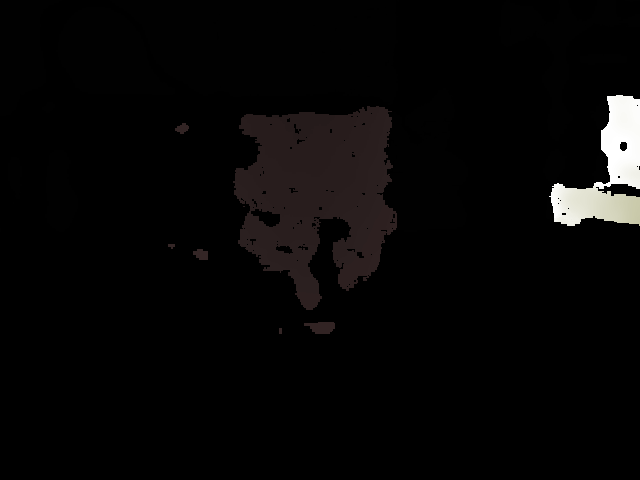
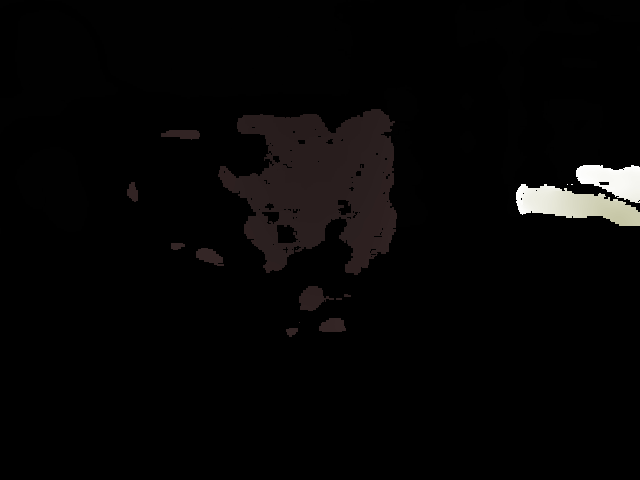
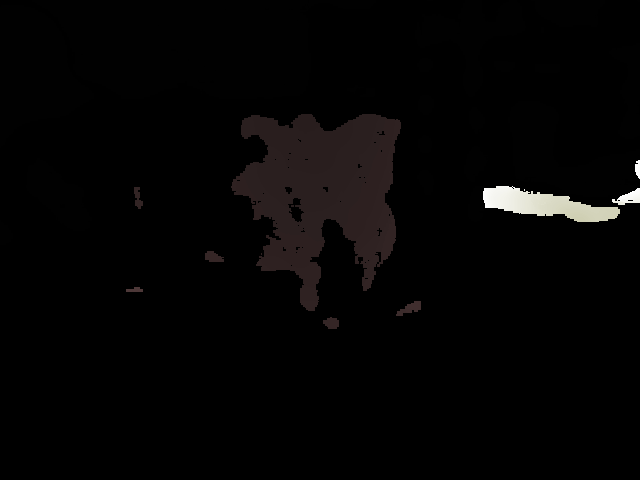
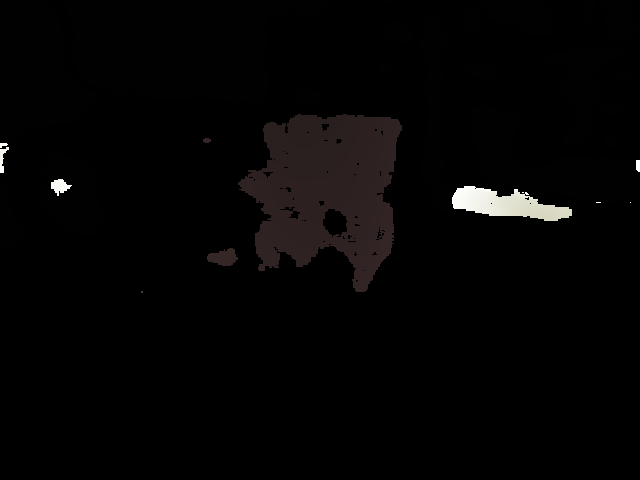
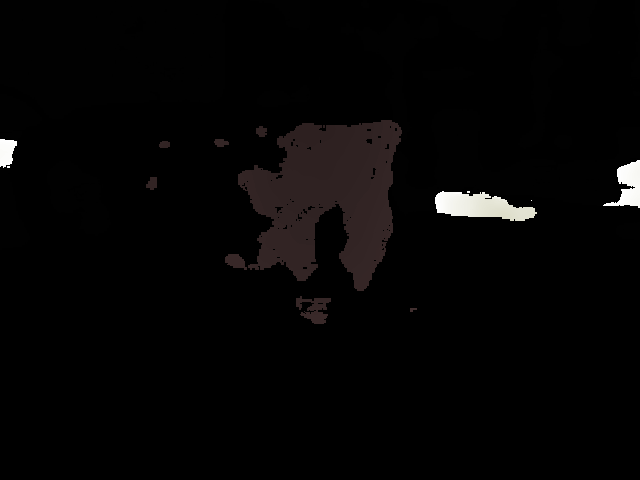
...
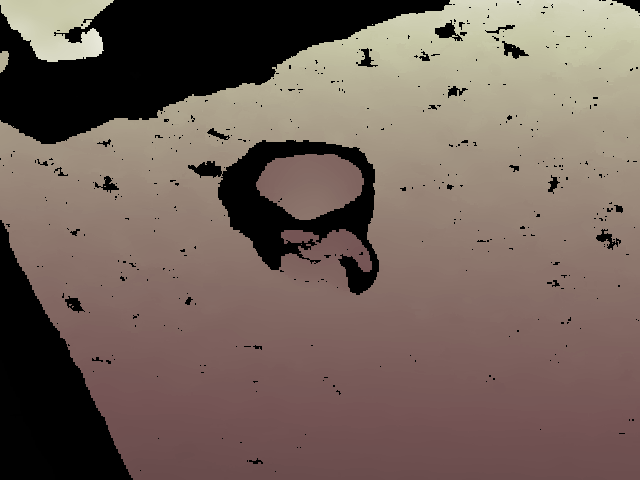
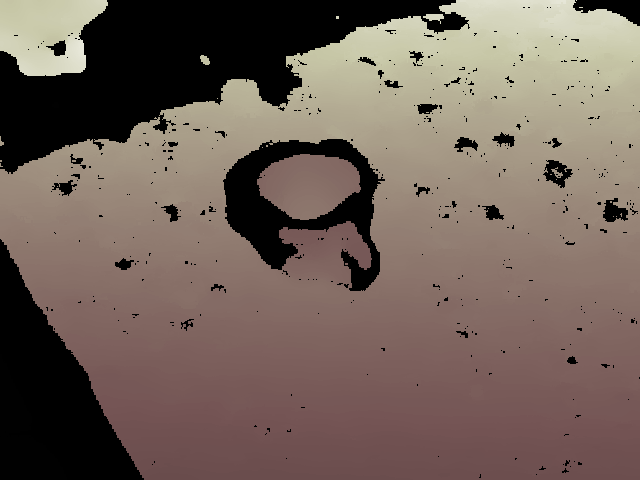
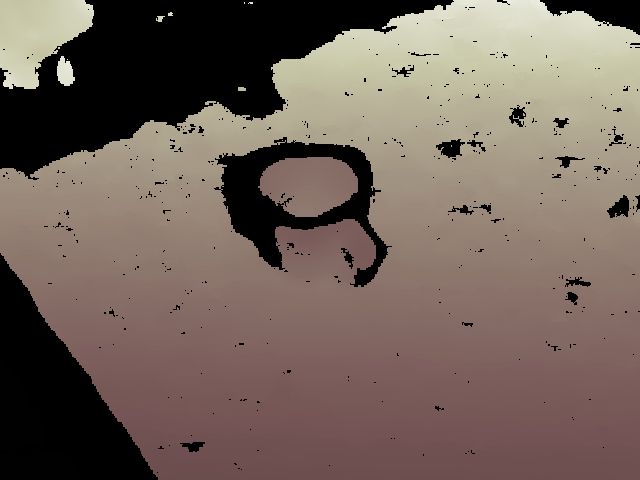
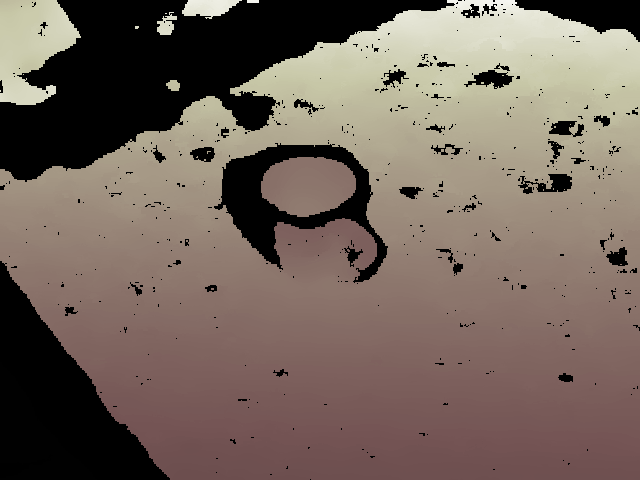
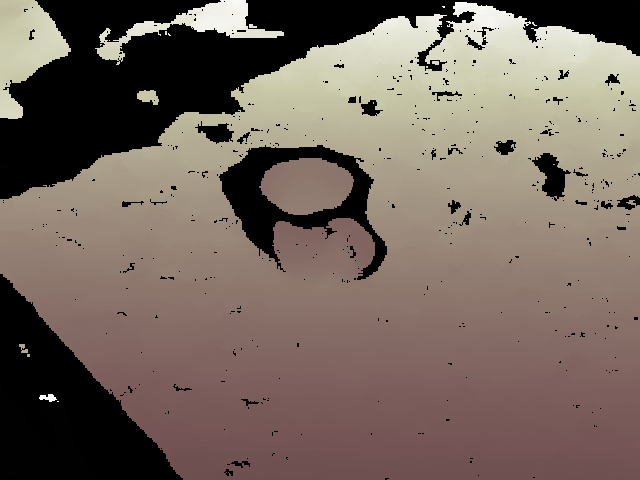

In [3]:
depth_images = [cv2.imread(frame.depth_file, cv2.IMREAD_ANYDEPTH) for frame in dataset.frames]

min_depth = 100
max_depth = 1000

# We clip the depth to have more color range in the depth we are interested in
colorized_depth_images = [image.clip(100, 1000) for image in depth_images]
colorized_depth_images = [cv2.normalize(image, None, 0, 65535, norm_type=cv2.NORM_MINMAX) for image in colorized_depth_images]
colorized_depth_images = [cv2.applyColorMap((image / 255).astype(np.uint8), cv2.COLORMAP_BONE) for image in colorized_depth_images]

ipyplot.plot_images(colorized_depth_images, max_images=200)

## Point cloud
We can extract a point cloud from the depth image using the camera intrinsic matrix. We can see that the the point clouds are blobby and have shadows behind objects.

In [4]:
import ipywidgets  as widgets

@widgets.interact(frame_id=(0, len(dataset.frames) - 1))
def draw_point_cloud(frame_id=52):
    color_image = o3d.io.read_image(dataset.frames[frame_id].color_file)
    depth_image = o3d.io.read_image(dataset.frames[frame_id].depth_file)
    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(color_image, depth_image, depth_scale=1000.0, depth_trunc=0.5, convert_rgb_to_intensity=False)
    camera_intrinsic = o3d.camera.PinholeCameraIntrinsic(640, 480, 613.688, 614.261, 323.035, 242.229)

    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        camera_intrinsic)

    vis.visualize_geometry([pcd], flip=True)

interactive(children=(IntSlider(value=52, description='frame_id', max=194), Output()), _dom_classes=('widget-i…

### Trajectory
Let's visualize the camera movement to understand the images better. We can render all point clouds together to find out if we have any gaps or missing data

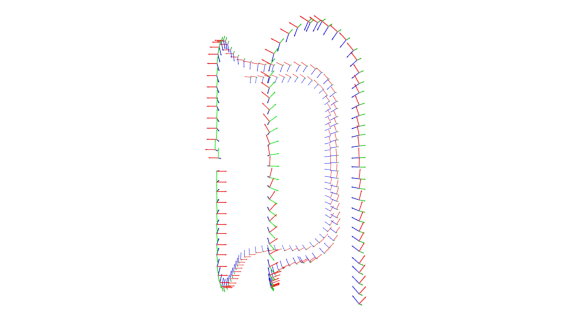

In [5]:
trajectory = [frame.get_transform() for frame in dataset.frames]

vis.visualize_trajectory(trajectory)

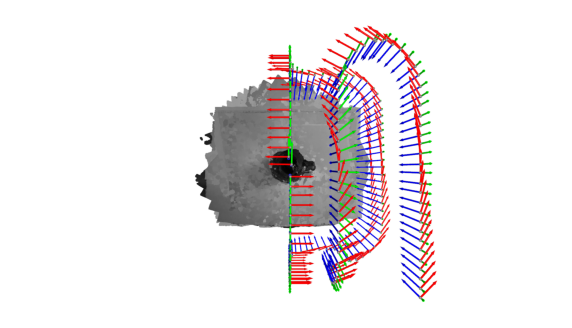

In [10]:
from copy import deepcopy

original_mesh = o3d.geometry.TriangleMesh.create_coordinate_frame()
original_mesh.scale(0.05, (0, 0, 0))
meshes = []
for frame in dataset.frames[:]:
    mesh = deepcopy(original_mesh)
    mesh.transform(frame.get_transform())
    meshes.append(mesh)

    color_image = o3d.io.read_image(frame.color_file)
    depth_image = o3d.io.read_image(frame.depth_file)
    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(color_image, depth_image, depth_scale=1000.0, depth_trunc=0.5)
    camera_intrinsic = o3d.camera.PinholeCameraIntrinsic(640, 480, 613.688, 614.261, 323.035, 242.229)
    
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        camera_intrinsic)
    pcd.transform(frame.get_transform())
    
    meshes.append(pcd)

vis.visualize_geometry(meshes)
o3d.visualization.draw_geometries(meshes)

TODO: Borrar

In [7]:
original_mesh = o3d.geometry.TriangleMesh.create_coordinate_frame()
original_mesh.scale(0.05, (0, 0, 0))
meshes = []
world_transform = np.identity(4)
for frame in dataset.frames:
    local_transform = np.matmul(np.linalg.inv(dataset.frames[frame.id - 1].get_transform()), dataset.frames[frame.id].get_transform())
    world_transform  = np.matmul(world_transform, local_transform)
    mesh = deepcopy(original_mesh)
    mesh.transform(world_transform)
    meshes.append(mesh)

    color_image = o3d.io.read_image(dataset.frames[frame.id].color_file)
    depth_image = o3d.io.read_image(dataset.frames[frame.id].depth_file)
    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(color_image, depth_image, depth_scale=1000.0, depth_trunc=3.0)
    camera_intrinsic = o3d.camera.PinholeCameraIntrinsic(640, 480, 613.688, 614.261, 323.035, 242.229)
    
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        camera_intrinsic)
    pcd.transform(world_transform)
    
    meshes.append(pcd)

o3d.visualization.draw_geometries(meshes)

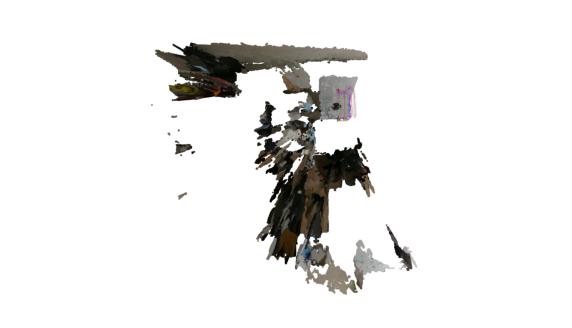

In [9]:
from copy import deepcopy

original_mesh = o3d.geometry.TriangleMesh.create_coordinate_frame()
original_mesh.scale(0.05, (0, 0, 0))
meshes = []
for frame in dataset.frames[:]:
    mesh = deepcopy(original_mesh)
    mesh.transform(frame.get_transform())
    meshes.append(mesh)

    depth_image = o3d.t.io.read_image(frame.depth_file)
    color_image = o3d.t.io.read_image(frame.color_file)
    rgbd_image = o3d.t.geometry.RGBDImage(color_image, depth_image)
    
    pcd = o3d.t.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        o3d.core.Tensor(np.array([[613.688, 0.0, 323.035], 
                            [0.0, 614.261, 242.229], 
                            [0.0, 0.0, 1.0]])),
        depth_scale=1000.0,
        depth_max=.0)
    # pcd.estimate_normals()
    meshes.append(pcd.to_legacy().transform(frame.get_transform()))

vis.visualize_geometry(meshes)
o3d.visualization.draw_geometries(meshes)